# Comparaison CLIP vs DINOv2 — Similarité visuelle

**Projet** : Gallica Images — Illustrations des *Métamorphoses* d'Ovide  
**Date**   : Avril 2026

Ce notebook compare les embeddings CLIP (API BnF) et DINOv2 (calculés localement)
pour la recherche par similarité visuelle sur les illustrations de Bernard Salomon (1557).

**Protocole :** Pour 10 illustrations Salomon choisies, on calcule les 5 illustrations
les plus similaires avec chaque modèle et on affiche les résultats côte à côte
pour évaluation qualitative par Céline Bohnert.

---

## Modèles comparés

| Modèle | Type | Dimension | Source |
|---|---|---|---|
| CLIP ViT-B/32 | Vision + Langage | 768D | API BnF (précalculé) |
| DINOv2 ViT-B/14 | Vision pure | 768D | Hugging Face (calculé localement) |

**CLIP** est entraîné sur des paires image-texte — il encode la sémantique visuelle
et textuelle conjointement.  
**DINOv2** est entraîné en auto-supervision sur des images uniquement — il encode
la structure visuelle pure sans supervision textuelle, ce qui peut être plus adapté
aux documents historiques.

---

## 1. Configuration

In [1]:
import requests
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
from io import BytesIO
from sklearn.metrics.pairwise import cosine_similarity

BASE_URL    = "https://gallica-search-api-preprod.bnf.lajavaness.com"
ARK_SALOMON = "btv1b2200047r"
N_SIMILAR   = 5   # nombre de résultats à afficher par modèle
N_PAGES     = 10  # nombre d'illustrations Salomon à tester

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device : {device}")

Device : cuda


## 2. Chargement des illustrations Salomon

Récupération des embeddings CLIP précalculés par l'API BnF.

In [2]:
r             = requests.get(f"{BASE_URL}/api/ouvrages/{ARK_SALOMON}/illustrations", timeout=30)
illustrations = r.json()
valides       = [
    i for i in illustrations
    if i.get("metas", {}).get("content_embedding")
    and len(i["metas"]["content_embedding"]) == 768
]

print(f"✓ {len(valides)} illustrations Salomon avec embedding CLIP")

# Sélectionner N_PAGES illustrations réparties uniformément
indices  = np.linspace(0, len(valides) - 1, N_PAGES, dtype=int)
test_set = [valides[i] for i in indices]
pages    = [i["view_number"] for i in test_set]
print(f"✓ Pages sélectionnées pour le test : {pages}")

✓ 184 illustrations Salomon avec embedding CLIP
✓ Pages sélectionnées pour le test : [1, 21, 40, 60, 80, 100, 120, 140, 160, 181]


## 3. Téléchargement des images

In [3]:
def get_image(url):
    """Télécharge une image depuis une URL."""
    r = requests.get(url, timeout=15)
    return Image.open(BytesIO(r.content)).convert("RGB")

images_pil = []
for i, illus in enumerate(test_set):
    print(f"  {i+1}/{N_PAGES} — page {illus['view_number']}...", end="\r")
    url = illus["metas"].get("link", "")
    images_pil.append(get_image(url))

print(f"\n✓ {len(images_pil)} images téléchargées")

  10/10 — page 181...
✓ 10 images téléchargées


## 4. Chargement de DINOv2

Modèle `facebook/dinov2-base` depuis Hugging Face.  
Entraîné en auto-supervision sur des images uniquement — sans supervision textuelle.

In [4]:
print("Chargement DINOv2...")
processor_dino = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
modele_dino    = AutoModel.from_pretrained("facebook/dinov2-base").to(device)
modele_dino.eval()
print("✓ DINOv2 chargé")

def embedding_dinov2(img):
    """Calcule l'embedding DINOv2 d'une image PIL."""
    inputs = processor_dino(images=img, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = modele_dino(**inputs)
    # CLS token — représentation globale de l'image
    emb = outputs.last_hidden_state[:, 0, :].cpu().numpy()[0]
    return emb / np.linalg.norm(emb)  # normalisation L2

Chargement DINOv2...


preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/223 [00:00<?, ?it/s]

✓ DINOv2 chargé


## 5. Calcul des embeddings DINOv2 pour toutes les illustrations Salomon

On calcule les embeddings DINOv2 pour les 184 illustrations — cela permet
de chercher les plus similaires dans le corpus Salomon lui-même.

In [5]:
print("Calcul des embeddings DINOv2 pour tout le corpus Salomon...")

embeddings_dino_all = []
images_all          = []
urls_all            = []
pages_all           = []

for i, illus in enumerate(valides):
    print(f"  {i+1}/{len(valides)}...", end="\r")
    url = illus["metas"].get("link", "")
    try:
        img = get_image(url)
        emb = embedding_dinov2(img)
        embeddings_dino_all.append(emb)
        images_all.append(img)
        urls_all.append(url)
        pages_all.append(illus["view_number"])
    except Exception as e:
        print(f"\n  Erreur page {illus['view_number']} : {e}")

embeddings_dino_all = np.array(embeddings_dino_all)
print(f"\n✓ {len(embeddings_dino_all)} embeddings DINOv2 calculés — shape : {embeddings_dino_all.shape}")

Calcul des embeddings DINOv2 pour tout le corpus Salomon...
  184/184...
✓ 184 embeddings DINOv2 calculés — shape : (184, 768)


## 6. Calcul des embeddings CLIP pour le corpus Salomon

Les embeddings CLIP sont déjà précalculés par l'API BnF.

In [6]:
embeddings_clip_all = np.array([
    illus["metas"]["content_embedding"]
    for illus in valides
])

# Normaliser les embeddings CLIP
norms = np.linalg.norm(embeddings_clip_all, axis=1, keepdims=True)
embeddings_clip_all = embeddings_clip_all / norms

print(f"✓ Embeddings CLIP — shape : {embeddings_clip_all.shape}")

✓ Embeddings CLIP — shape : (184, 768)


## 7. Comparaison visuelle CLIP vs DINOv2

Pour chaque illustration test, on affiche :
- L'illustration source (colonne gauche)
- Les 5 plus similaires selon CLIP (ligne du haut)
- Les 5 plus similaires selon DINOv2 (ligne du bas)

Les illustrations en commun entre les deux modèles sont indiquées en vert.

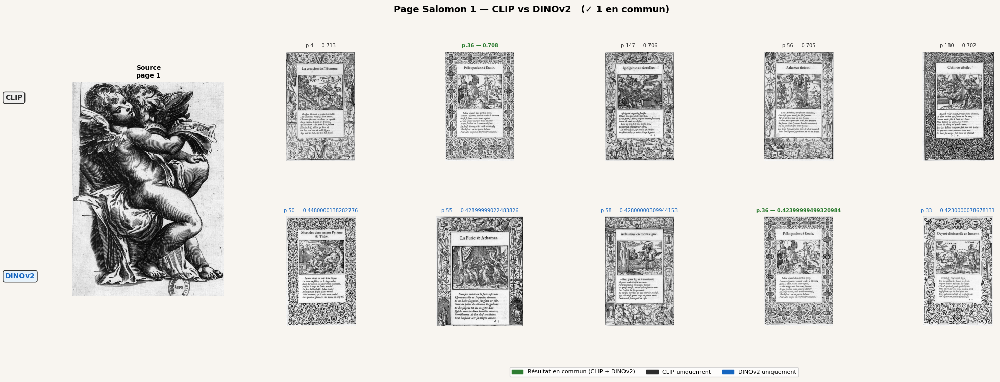

  Page 1 — commun : [36]
──────────────────────────────────────────────────────────────────────


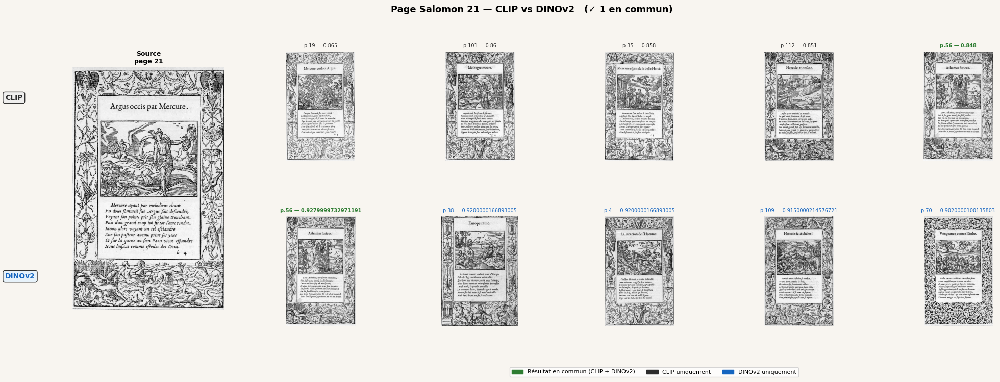

  Page 21 — commun : [56]
──────────────────────────────────────────────────────────────────────


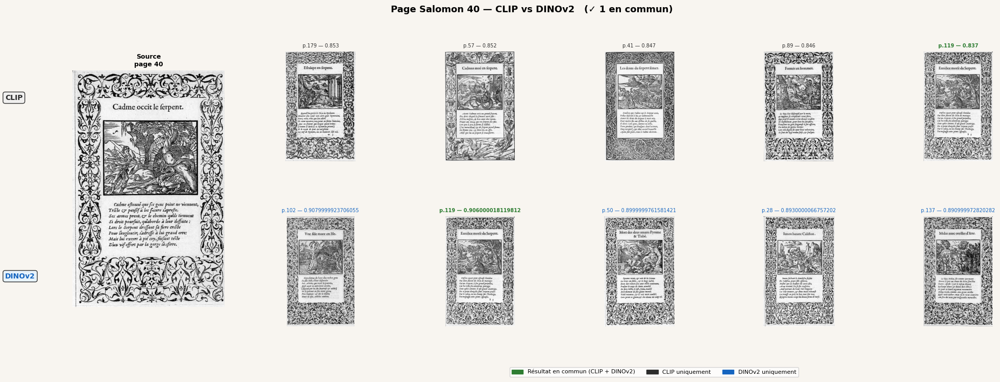

  Page 40 — commun : [119]
──────────────────────────────────────────────────────────────────────


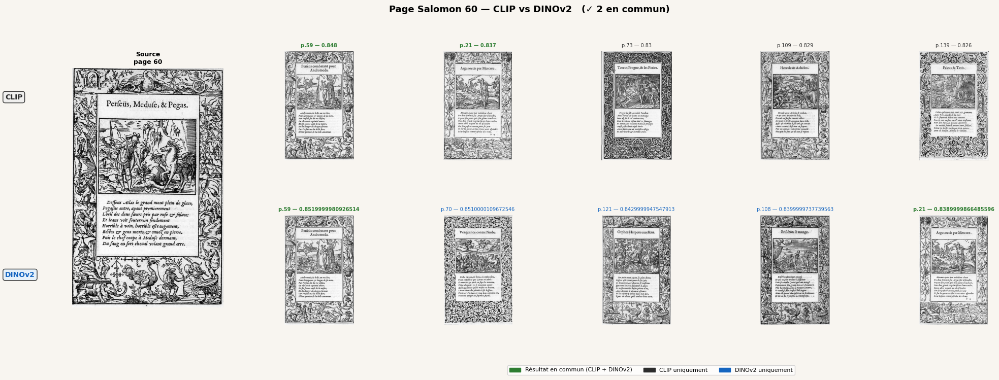

  Page 60 — commun : [21, 59]
──────────────────────────────────────────────────────────────────────


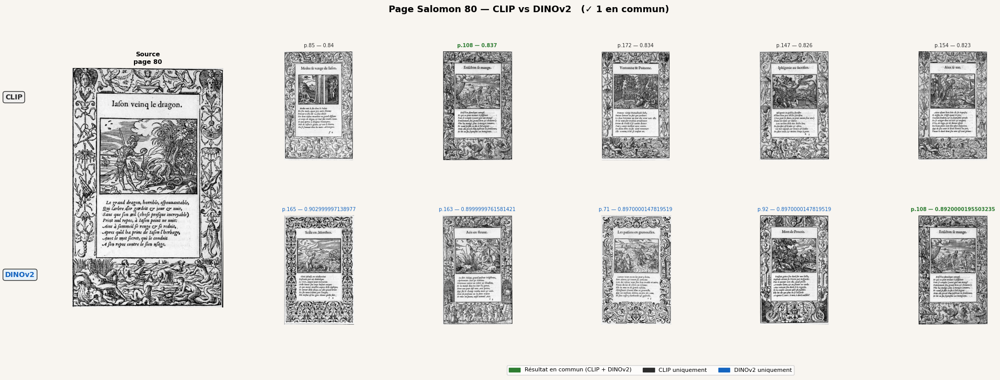

  Page 80 — commun : [108]
──────────────────────────────────────────────────────────────────────


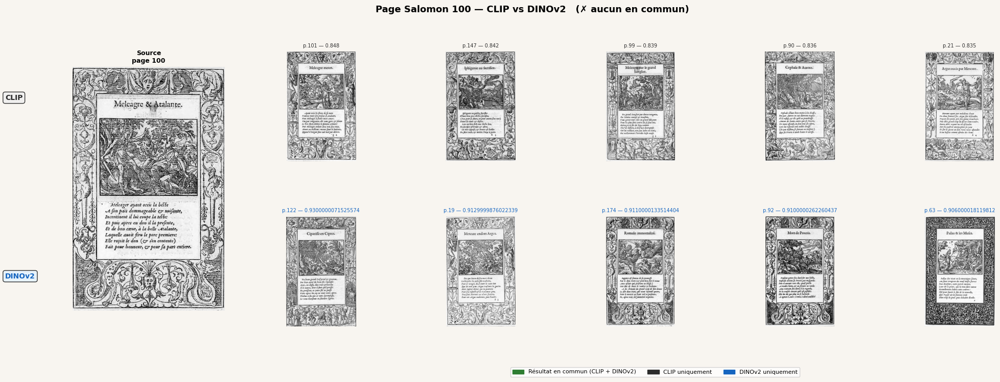

  Page 100 — commun : aucun
──────────────────────────────────────────────────────────────────────


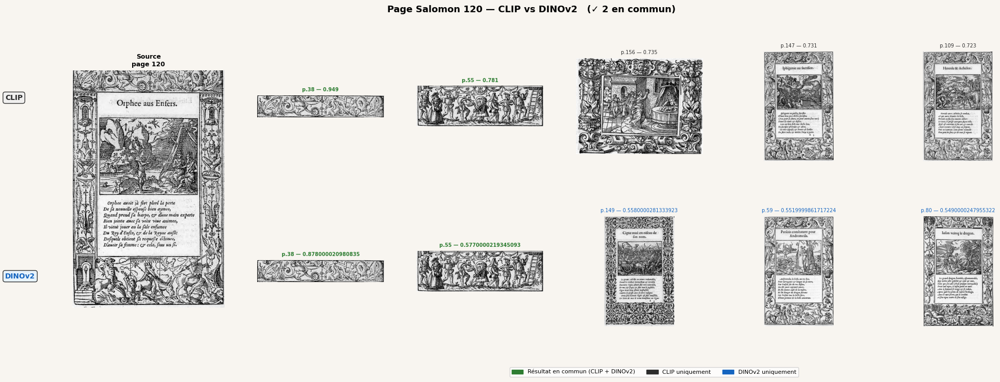

  Page 120 — commun : [38, 55]
──────────────────────────────────────────────────────────────────────


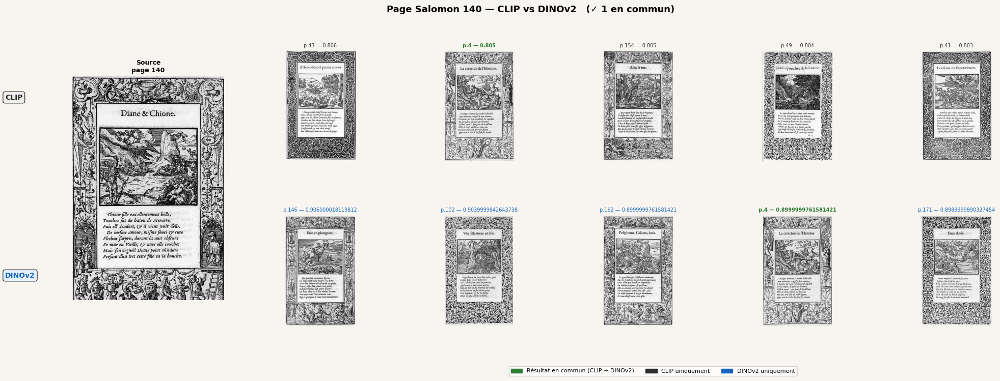

  Page 140 — commun : [4]
──────────────────────────────────────────────────────────────────────


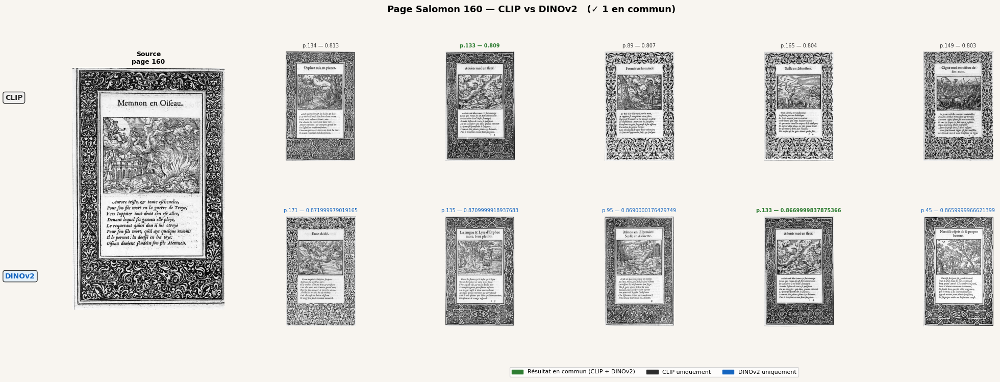

  Page 160 — commun : [133]
──────────────────────────────────────────────────────────────────────


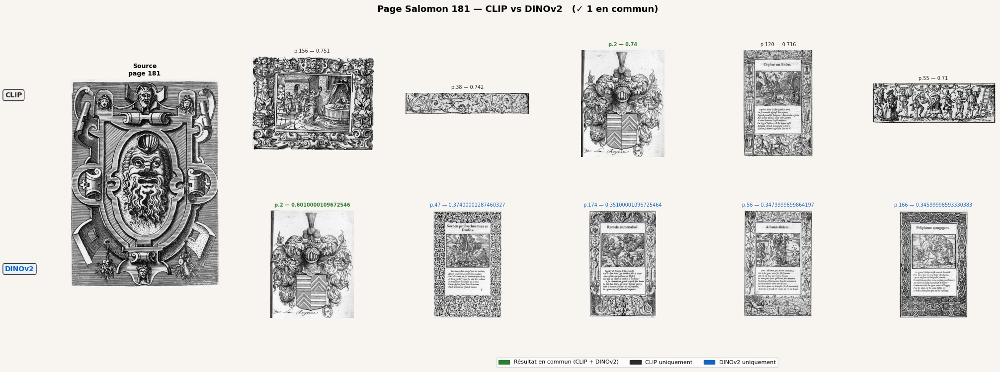

  Page 181 — commun : [2]
──────────────────────────────────────────────────────────────────────


In [7]:
for idx_test, illus in enumerate(test_set):
    page    = illus["view_number"]
    img_src = images_pil[idx_test]

    # Trouver l'index dans le corpus complet
    idx_corpus = pages_all.index(page) if page in pages_all else None
    if idx_corpus is None:
        print(f"Page {page} non trouvée dans le corpus")
        continue

    # ── Similarités CLIP ──────────────────────────────────────
    emb_clip   = embeddings_clip_all[idx_corpus].reshape(1, -1)
    sims_clip  = cosine_similarity(emb_clip, embeddings_clip_all)[0]
    sims_clip[idx_corpus] = -1  # exclure l'image elle-même
    top_clip   = np.argsort(sims_clip)[::-1][:N_SIMILAR]

    # ── Similarités DINOv2 ────────────────────────────────────
    emb_dino   = embeddings_dino_all[idx_corpus].reshape(1, -1)
    sims_dino  = cosine_similarity(emb_dino, embeddings_dino_all)[0]
    sims_dino[idx_corpus] = -1
    top_dino   = np.argsort(sims_dino)[::-1][:N_SIMILAR]

    # Pages en commun entre les deux modèles
    pages_clip    = set(pages_all[i] for i in top_clip)
    pages_dino    = set(pages_all[i] for i in top_dino)
    pages_communs = pages_clip & pages_dino

    # ── Figure ────────────────────────────────────────────────
    fig = plt.figure(figsize=(24, 7))
    fig.patch.set_facecolor("#f8f5f0")
    fig.suptitle(
        f"Page Salomon {page} — CLIP vs DINOv2   "
        f"({'✓ ' + str(len(pages_communs)) + ' en commun' if pages_communs else '✗ aucun en commun'})",
        fontsize=13, fontweight="bold", y=1.01
    )

    gs = gridspec.GridSpec(
        2, N_SIMILAR + 1, figure=fig,
        hspace=0.5, wspace=0.25,
        width_ratios=[1.2] + [1] * N_SIMILAR
    )

    # Image source — occupe les deux lignes
    ax_src = fig.add_subplot(gs[:, 0])
    ax_src.imshow(img_src)
    ax_src.set_title(f"Source\npage {page}",
                     fontsize=9, fontweight="bold", pad=6)
    ax_src.axis("off")
    for spine in ax_src.spines.values():
        spine.set_edgecolor("#2c2c2c")
        spine.set_linewidth(2)

    # Résultats CLIP (ligne du haut)
    for j, idx in enumerate(top_clip):
        ax = fig.add_subplot(gs[0, j + 1])
        try:
            ax.imshow(images_all[idx])
        except Exception:
            ax.text(0.5, 0.5, "N/A", ha="center", va="center",
                    transform=ax.transAxes)

        p     = pages_all[idx]
        score = round(sims_clip[idx], 3)
        commun = p in pages_communs

        ax.set_title(f"p.{p} — {score}",
                     fontsize=7,
                     color="#2e7d32" if commun else "#2c2c2c",
                     fontweight="bold" if commun else "normal")
        ax.axis("off")
        if commun:
            for spine in ax.spines.values():
                spine.set_edgecolor("#2e7d32")
                spine.set_linewidth(2.5)
                spine.set_visible(True)

    # Résultats DINOv2 (ligne du bas)
    for j, idx in enumerate(top_dino):
        ax = fig.add_subplot(gs[1, j + 1])
        try:
            ax.imshow(images_all[idx])
        except Exception:
            ax.text(0.5, 0.5, "N/A", ha="center", va="center",
                    transform=ax.transAxes)

        p      = pages_all[idx]
        score  = round(sims_dino[idx], 3)
        commun = p in pages_communs

        ax.set_title(f"p.{p} — {score}",
                     fontsize=7,
                     color="#2e7d32" if commun else "#1565c0",
                     fontweight="bold" if commun else "normal")
        ax.axis("off")
        if commun:
            for spine in ax.spines.values():
                spine.set_edgecolor("#2e7d32")
                spine.set_linewidth(2.5)
                spine.set_visible(True)

    # Labels lignes
    fig.text(0.07, 0.75, "CLIP",   fontsize=10, fontweight="bold",
             va="center", color="#2c2c2c",
             bbox=dict(boxstyle="round", facecolor="#eeeeee", alpha=0.8))
    fig.text(0.07, 0.25, "DINOv2", fontsize=10, fontweight="bold",
             va="center", color="#1565c0",
             bbox=dict(boxstyle="round", facecolor="#e3f2fd", alpha=0.8))

    # Légende
    patch_commun = mpatches.Patch(color="#2e7d32",
                                   label="Résultat en commun (CLIP + DINOv2)")
    patch_clip   = mpatches.Patch(color="#2c2c2c",
                                   label="CLIP uniquement")
    patch_dino   = mpatches.Patch(color="#1565c0",
                                   label="DINOv2 uniquement")
    fig.legend(handles=[patch_commun, patch_clip, patch_dino],
               loc="lower center", ncol=3, fontsize=8,
               bbox_to_anchor=(0.6, -0.04))

    plt.show()
    print(f"  Page {page} — commun : {sorted(pages_communs) if pages_communs else 'aucun'}")
    print("─" * 70)

## 8. Récapitulatif — Taux de similarité entre CLIP et DINOv2

Pour chaque illustration test, combien de résultats sont en commun entre les deux modèles ?

In [8]:
print(f"{'Page':>6} | {'Communs':>8} | {'CLIP seul':>10} | {'DINOv2 seul':>12}")
print("─" * 45)

total_communs = 0

for idx_test, illus in enumerate(test_set):
    page       = illus["view_number"]
    idx_corpus = pages_all.index(page) if page in pages_all else None
    if idx_corpus is None:
        continue

    emb_clip  = embeddings_clip_all[idx_corpus].reshape(1, -1)
    sims_clip = cosine_similarity(emb_clip, embeddings_clip_all)[0]
    sims_clip[idx_corpus] = -1
    top_clip  = set(np.argsort(sims_clip)[::-1][:N_SIMILAR])

    emb_dino  = embeddings_dino_all[idx_corpus].reshape(1, -1)
    sims_dino = cosine_similarity(emb_dino, embeddings_dino_all)[0]
    sims_dino[idx_corpus] = -1
    top_dino  = set(np.argsort(sims_dino)[::-1][:N_SIMILAR])

    communs     = len(top_clip & top_dino)
    clip_seul   = len(top_clip - top_dino)
    dino_seul   = len(top_dino - top_clip)
    total_communs += communs

    print(f"{page:>6} | {communs:>8} | {clip_seul:>10} | {dino_seul:>12}")

print("─" * 45)
print(f"  Taux accord moyen : {total_communs / (N_PAGES * N_SIMILAR) * 100:.1f}%")
print(f"  ({total_communs} résultats en commun sur {N_PAGES * N_SIMILAR} possibles)")

  Page |  Communs |  CLIP seul |  DINOv2 seul
─────────────────────────────────────────────
     1 |        1 |          4 |            4
    21 |        1 |          4 |            4
    40 |        1 |          4 |            4
    60 |        2 |          3 |            3
    80 |        1 |          4 |            4
   100 |        0 |          5 |            5
   120 |        2 |          3 |            3
   140 |        1 |          4 |            4
   160 |        1 |          4 |            4
   181 |        1 |          4 |            4
─────────────────────────────────────────────
  Taux accord moyen : 22.0%
  (11 résultats en commun sur 50 possibles)
